# Awesome Celebrity Look Alike Project
In this notebook I'm putting to practice things I've learned from fast.ai's course [Practical Deep Learning for Coders - Part 1](https://course.fast.ai/). More specifically, CNN and Image Classifiers. 

A common problem I face in my day to day life is being compared to good-looking, long haired celebrities _(SARCASM)_. 

What I've noticed is there isn't a consensus still about which celebrity I'm most similar. So we'll let the decision be made by a CNN classifier and settle this great modern dilemma once and for all!

### Getting the necessary dependencies
Let's start out downloading the fast.ai library and also [fastclass]((https://github.com/cwerner/fastclass), a great and practical way to create an image database for your DS projects.

In [1]:
  !curl -s https://course.fast.ai/setup/colab | bash
  !pip install git+https://github.com/cwerner/fastclass.git#egg=fastclass

Updating fastai...
Done.
  Cloning https://github.com/cwerner/fastclass.git to /tmp/pip-install-pxhki0jd/fastclass
  Running command git clone -q https://github.com/cwerner/fastclass.git /tmp/pip-install-pxhki0jd/fastclass
  Created wheel for fastclass: filename=fastclass-0.2.0-cp36-none-any.whl size=16150 sha256=6df8e06d0235bdad06db2c6981f70de603585315936714321e05d9337fa6b19d
  Stored in directory: /tmp/pip-ephem-wheel-cache-sadvlr6y/wheels/85/6e/d5/52ccfe3ffa172e009d525d12dd3e6d187e896272b538703cbf
Successfully built fastclass


In [2]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/Colab Notebooks/"
base_dir = root_dir + 'fast.ai/celebrity_lookalike'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
from fastai.vision import *
import numpy as np

# Part 1 - CNN Classifier
### Getting our hands dirty

Now, we'll search for images to use as part of our training and validation datasets using [cwerner fastclass](https://github.com/cwerner/fastclass).

Five different celebrities were chosen for this experiment: Brad Pitt, Taylor Hawkins (Foo Fighters's drummer), Daniel Johns (the lead singer of Silverchair), Kurt Cobain, Chris Hemwsworth (as Thor) and Charlie Hunnam (as Jax from the TV show Sons of Anarchy).

In [0]:
!fcd -c GOOGLE -s 224 /content/gdrive/My\ Drive/Colab\ Notebooks/fast.ai/celebrity_lookalike/search.csv -o /content/gdrive/My\ Drive/Colab\ Notebooks/fast.ai/celebrity_lookalike/data/

Directory "/content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/data/" exists. Would you like to overwrite the directory? [y/n]
y
INFO: final dataset will be located in /content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/data/
[1/6] Searching: >> brad pitt <<
(1) Crawling ...
    -> GOOGLE
Number of duplicate image files: 0. Removing...
(2) Resizing images to (224, 224)
100% 78/78 [00:03<00:00, 21.72it/s]
[2/6] Searching: >> taylor hawkins foo fighters <<
(1) Crawling ...
    -> GOOGLE
Number of duplicate image files: 0. Removing...
(2) Resizing images to (224, 224)
100% 87/87 [00:02<00:00, 30.42it/s]
[3/6] Searching: >> kurt cobain <<
(1) Crawling ...
    -> GOOGLE
Number of duplicate image files: 0. Removing...
(2) Resizing images to (224, 224)
100% 83/83 [00:03<00:00, 27.64it/s]
[4/6] Searching: >> chris hemsworth thor <<
(1) Crawling ...
    -> GOOGLE
Number of duplicate image files: 0. Removing...
(2) Resizing images to (224, 224)
100% 53/53 [00:02

Let's have a look at our data...

In [0]:
np.random.seed(42)
path = base_dir + '/data'
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
         size=224, num_workers=4).normalize(imagenet_stats)

In [0]:
data.classes

['brad_pitt', 'daniel_johns', 'jax', 'kurt_cobain', 'taylor_hawkins', 'thor']

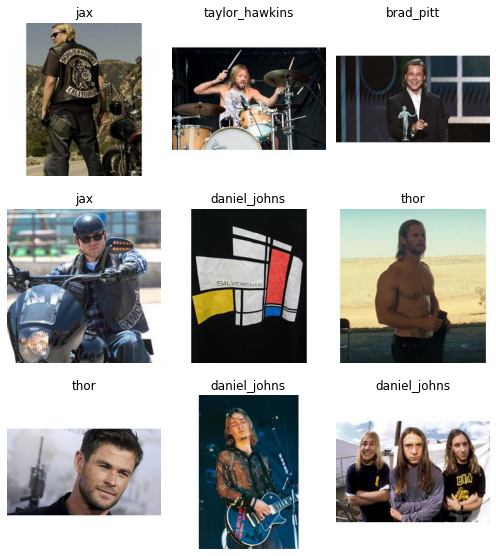

In [0]:
data.show_batch(rows=3, figsize=(7,8))

In [0]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['brad_pitt', 'daniel_johns', 'jax', 'kurt_cobain', 'taylor_hawkins', 'thor'],
 6,
 363,
 90)

### Training the model
We'll be training our celebrity classifier over a resnet50. The idea is to create a CNN that can classify pictures accordingly for those five personalities. Once it's in top form, we'll show it a picture of myself and see who the CNN think I'm most similar too.

In [0]:
learn = cnn_learner(data, models.resnet50, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [0]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.374347,3.489743,0.600000,00:04
1,1.452199,2.121295,0.344444,00:02
2,1.021508,1.457575,0.288889,00:02
3,0.761324,1.254855,0.288889,00:02


In [0]:
learn.save('stage-1')

In [0]:
learn.load('stage-1')

Learner(data=ImageDataBunch;

Train: LabelList (363 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
brad_pitt,brad_pitt,brad_pitt,brad_pitt,brad_pitt
Path: /content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/data;

Valid: LabelList (90 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
jax,brad_pitt,jax,jax,taylor_hawkins
Path: /content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/data;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(

In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


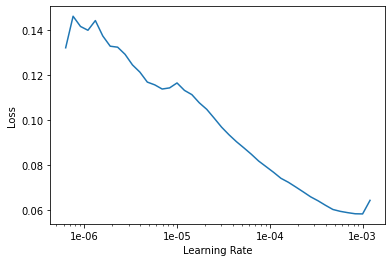

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(10, max_lr=slice(1e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.073004,1.088552,0.300000,00:03
1,0.051798,1.085359,0.300000,00:03
2,0.046329,1.064152,0.311111,00:03
3,0.040177,1.047200,0.288889,00:03
4,0.034848,1.046267,0.288889,00:03
5,0.032177,1.046958,0.288889,00:03
6,0.028666,1.053274,0.288889,00:03
7,0.025006,1.054842,0.288889,00:03
8,0.022946,1.054743,0.288889,00:03
9,0.022281,1.050424,0.300000,00:03


In [0]:
learn.save('stage-2')

### Let's interpret the results we got so far:

In [0]:
learn.load('stage-2')

Learner(data=ImageDataBunch;

Train: LabelList (363 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
brad_pitt,brad_pitt,brad_pitt,brad_pitt,brad_pitt
Path: /content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/data;

Valid: LabelList (90 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
jax,brad_pitt,jax,jax,taylor_hawkins
Path: /content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/data;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

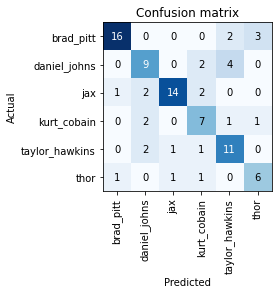

In [0]:
interp.plot_confusion_matrix()

It seems that the CNN got mostly confused with Kurt Cobain, Daniel Johns and Taylor Hawkings, which makes sense. They are the ones that look most similar out of the six different classes.

Let's try cleaning up our original data, since there are some misclassified and noise images there, to see if we get some better results.

### Cleaning up

In [0]:
from fastai.widgets import *

In [0]:
db = (ImageList.from_folder(path)
                   .split_none()
                   .label_from_folder()
                   .transform(get_transforms(), size=224)
                   .databunch()
     )

In [0]:
learn_cln = cnn_learner(db, models.resnet50, metrics=error_rate)

learn_cln.load('stage-2');

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [0]:
ds, idxs = DatasetFormatter().from_toplosses(learn_cln)

In [0]:
ImageCleaner(ds, idxs, path)

'No images to show :)'

Rename "cleaned.csv" to "labels.csv"

In [0]:
!mv /content/gdrive/My\ Drive/Colab\ Notebooks/fast.ai/celebrity_lookalike/data/cleaned.csv /content/gdrive/My\ Drive/Colab\ Notebooks/fast.ai/celebrity_lookalike/data/labels.csv

All done with cleaning up our dataset, let's go back to training!

In [0]:
path = base_dir + '/data'
data = ImageDataBunch.from_csv(path, valid_pct=0.2,
         size=224, num_workers=4).normalize(imagenet_stats)
learn = cnn_learner(data, models.resnet50, metrics=error_rate)
learn.load('stage-2')

Learner(data=ImageDataBunch;

Train: LabelList (265 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
brad_pitt,brad_pitt,brad_pitt,brad_pitt,brad_pitt
Path: /content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/data;

Valid: LabelList (66 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
kurt_cobain,taylor_hawkins,jax,kurt_cobain,jax
Path: /content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/data;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1

I've tested out multiple weight decay values, finding 50 as the one that showcases best results, and that's the one we'll use to retrain our model.

In [0]:
wd = 50
print(wd)
learn.load('stage-2')
learn.fit_one_cycle(50, max_lr=slice(1e-4), wd = wd )

50


epoch,train_loss,valid_loss,error_rate,time
0,0.281235,0.212508,0.045455,00:08
1,0.295377,0.215231,0.045455,00:05
2,0.273896,0.220158,0.045455,00:05
3,0.277000,0.222197,0.045455,00:05
4,0.273353,0.220072,0.045455,00:05
5,0.264879,0.216327,0.045455,00:05
6,0.257377,0.211584,0.045455,00:05
7,0.245975,0.205610,0.045455,00:05
8,0.226546,0.199693,0.045455,00:05
9,0.207543,0.190344,0.045455,00:05


Wow! Cleaning up the dataset lead to great results. We went from 30% error rate to only 1.5%!

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

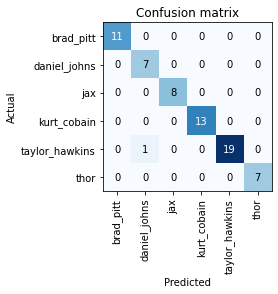

In [0]:
interp.plot_confusion_matrix()

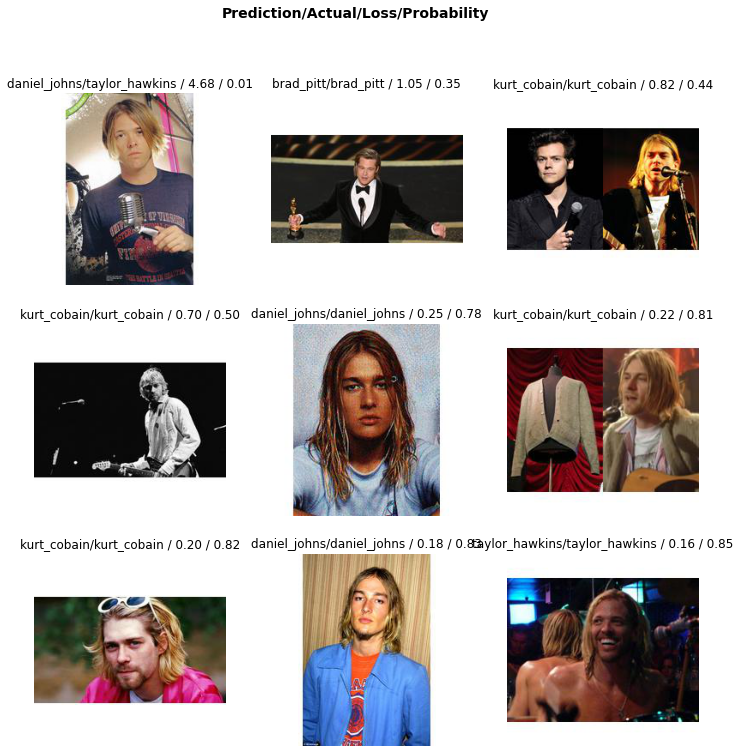

In [0]:
interp.plot_top_losses(9)

The only image the modelo got wrong out of the validation set is a very understandable error. It's a photo from a very young Taylor Hawkins, so he does look much more like Daniel Johns then himself in the rest of his other photos (where he is older and bearded).

### Time for the model to decide! Which celebrity I look most similar too?
I got two different photos of myself for the model to guess.

One is of me nowadays and the other is a photo from 2011, when I was still a teen. 

Let's see what the final results are.

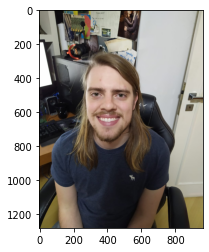

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Predicted celebrity: jax -- Probability: 0.7729869484901428
Celebrities guesses:
brad_pitt: 0.011807597242295742
daniel_johns: 0.11181629449129105
jax: 0.7729869484901428
kurt_cobain: 0.02274245209991932
taylor_hawkins: 0.07829675078392029
thor: 0.0023499715607613325


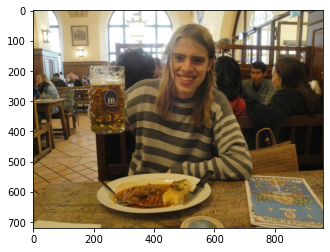

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Predicted celebrity: daniel_johns -- Probability: 0.9191012978553772
Celebrities guesses:
brad_pitt: 0.0033877575770020485
daniel_johns: 0.9191012978553772
jax: 0.044679801911115646
kurt_cobain: 0.013195609673857689
taylor_hawkins: 0.012530126608908176
thor: 0.0071054548025131226


In [0]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for img_path in Path(base_dir + '/my_photos/').ls():
  img = open_image(img_path)

  display_img = mpimg.imread(img_path)
  plt.imshow(display_img)
  plt.show()

  category = learn.predict(img)[0]
  probability = learn.predict(img)[2].max()


  print(f'Predicted celebrity: {category} -- Probability: {probability}')
  print(f'Celebrities guesses:')
  for i, c in enumerate(data.classes):
    print(f'{c}: {learn.predict(img)[2][i]}')

The great question is settled! 

The __celebrity I look most like, nowadays, is Charlie Hunnam as Jax in Sons of Anarchy__. It's nice to see that my younger photo I'm classified, with a strong probability, as Daniel Johns. This makes a lot of sense, since I'm not bearded in that photo and have softer, younger features than my current self.

Thanks for the help, CNN model :)

# Part 2 - Classifying my friends
After seeing the results of the CNN model classifying myself, I decided to expand it a little bit and also classify some of my friends as well. 

Since we all are different from each other, I got new celebrities to train the model with which look a little bit similar to my friends.

In [0]:
# Getting the new dataset
!fcd -c GOOGLE -s 224 /content/gdrive/My\ Drive/Colab\ Notebooks/fast.ai/celebrity_lookalike/search_2.csv -o /content/gdrive/My\ Drive/Colab\ Notebooks/fast.ai/celebrity_lookalike/friend_data/

Directory "/content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/friend_data/" exists. Would you like to overwrite the directory? [y/n]
y
INFO: final dataset will be located in /content/gdrive/My Drive/Colab Notebooks/fast.ai/celebrity_lookalike/friend_data/
[1/13] Searching: >> brad pitt <<
(1) Crawling ...
    -> GOOGLE
Number of duplicate image files: 0. Removing...
(2) Resizing images to (224, 224)
100% 58/58 [00:03<00:00, 16.97it/s]
[2/13] Searching: >> taylor hawkins foo fighters <<
(1) Crawling ...
    -> GOOGLE
Number of duplicate image files: 0. Removing...
(2) Resizing images to (224, 224)
100% 90/90 [00:03<00:00, 23.86it/s]
[3/13] Searching: >> kurt cobain <<
(1) Crawling ...
    -> GOOGLE
Number of duplicate image files: 0. Removing...
(2) Resizing images to (224, 224)
100% 88/88 [00:04<00:00, 21.35it/s]
[4/13] Searching: >> chris hemsworth thor <<
(1) Crawling ...
    -> GOOGLE
Number of duplicate image files: 0. Removing...
(2) Resizing images to (224, 224)

In [0]:
np.random.seed(42)
friends_path = base_dir + '/friends_data'
friends_data = ImageDataBunch.from_folder(friends_path, train=".", valid_pct=0.2,
         size=224, num_workers=4).normalize(imagenet_stats)

In [0]:
friends_data.classes

['brad_pitt',
 'daniel_johns',
 'dwayne_johnson',
 'jason_statham',
 'jax',
 'jesse_pinkman',
 'kurt_cobain',
 'poe_dameron',
 'taylor_hawkins',
 'thor',
 'tom_felton',
 'young_john_goodman']

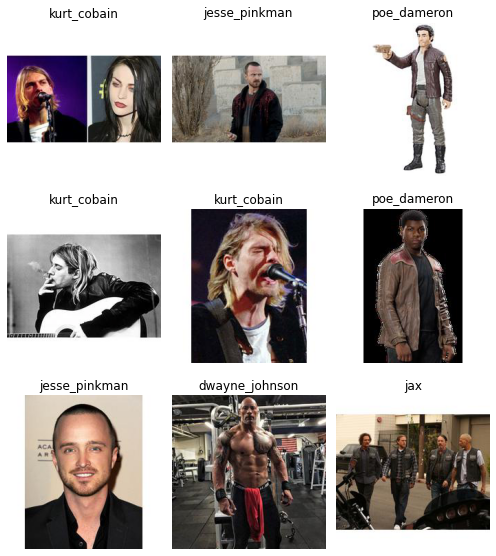

In [0]:
friends_data.show_batch(rows = 3, figsize= (7,8))

In [0]:
friends_data.classes, friends_data.c, len(friends_data.train_ds), len(friends_data.valid_ds)

(['brad_pitt',
  'daniel_johns',
  'dwayne_johnson',
  'jason_statham',
  'jax',
  'jesse_pinkman',
  'kurt_cobain',
  'poe_dameron',
  'taylor_hawkins',
  'thor',
  'tom_felton',
  'young_john_goodman'],
 12,
 761,
 190)

In [0]:
friends_learn = cnn_learner(friends_data, models.resnet50, metrics = error_rate)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [0]:
friends_learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.937221,2.382112,0.610526,01:54
1,1.847884,1.915157,0.489474,00:08
2,1.275218,1.748293,0.431579,00:04
3,0.938622,1.669851,0.410526,00:04


In [0]:
friends_learn.unfreeze()

In [0]:
friends_learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


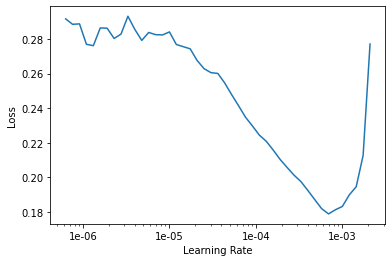

In [0]:
friends_learn.recorder.plot()

In [0]:
friends_learn.fit_one_cycle(4,max_lr=slice(1e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.258120,1.644842,0.389474,00:05
1,0.205010,1.583823,0.415789,00:05
2,0.169555,1.548715,0.394737,00:05
3,0.145599,1.555550,0.415789,00:05


In [0]:
friends_learn.save('friends-stage-1')

In [0]:
friends_interp = ClassificationInterpretation.from_learner(friends_learn)

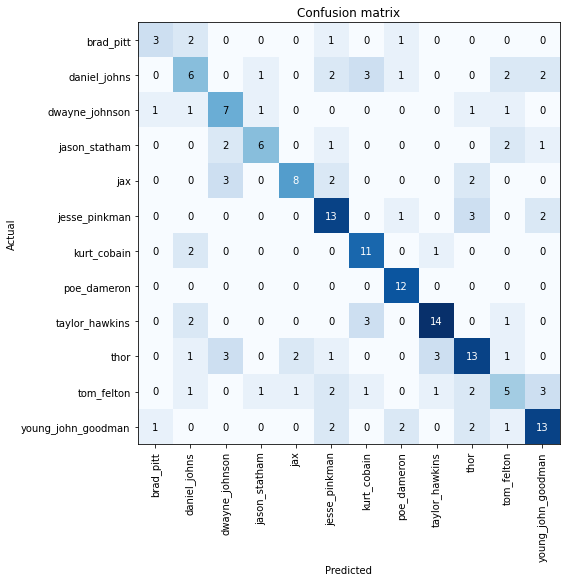

In [0]:
friends_interp.plot_confusion_matrix(figsize = (10,8))

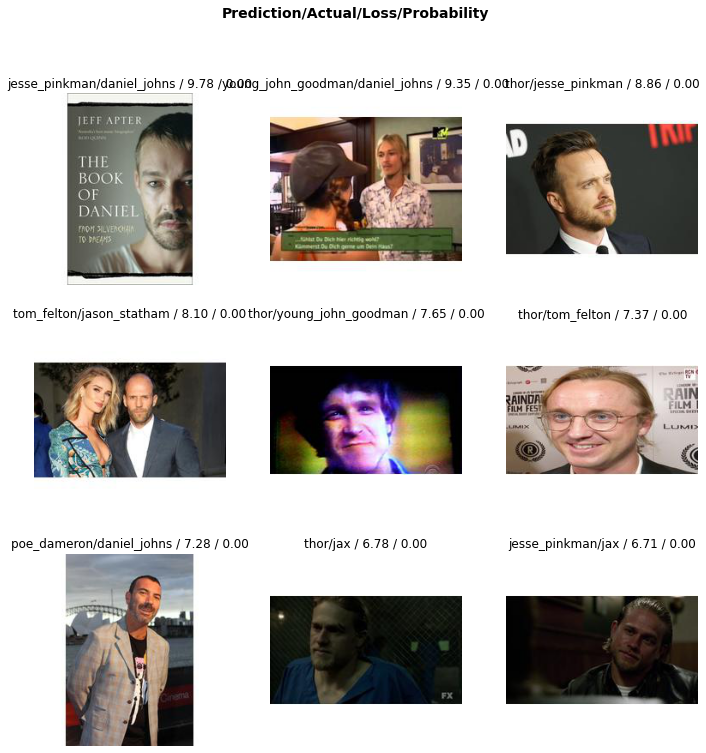

In [0]:
friends_interp.plot_top_losses(9)

Again, there's tons of noise data we need to clean up, so let's get to it.

In [0]:
from fastai.widgets import *

In [0]:
db_2 = (ImageList.from_folder(friends_path)
                   .split_none()
                   .label_from_folder()
                   .transform(get_transforms(), size=224)
                   .databunch()
     )

In [0]:
learn_cln_2 = cnn_learner(friends_data, models.resnet50, metrics = error_rate)

learn_cln_2.load('friends-stage-1')

ds, idxs = DatasetFormatter().from_toplosses(learn_cln_2)

In [0]:
ImageCleaner(ds, idxs, friends_path)

'No images to show :)'

In [0]:
!mv /content/gdrive/My\ Drive/Colab\ Notebooks/fast.ai/celebrity_lookalike/friends_data/cleaned.csv /content/gdrive/My\ Drive/Colab\ Notebooks/fast.ai/celebrity_lookalike/friends_data/labels.csv

### Now, let's retrain the model with the cleaned dataset

In [4]:
np.random.seed(42)
friends_path = base_dir + '/friends_data'
friends_data = ImageDataBunch.from_csv(friends_path, valid_pct=0.35,
         size=224, num_workers=4).normalize(imagenet_stats)
friends_learn = cnn_learner(friends_data, models.resnet50, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [5]:
friends_learn.load('friends-stage-1')

friends_learn.fit_one_cycle(4, max_lr=slice(1e-4), wd = 10)

epoch,train_loss,valid_loss,error_rate,time
0,0.409917,0.147433,0.039801,01:27
1,0.382371,0.146292,0.039801,00:12
2,0.372634,0.146265,0.044776,00:07
3,0.355935,0.148093,0.044776,00:07


In [6]:
friends_interp = ClassificationInterpretation.from_learner(friends_learn)

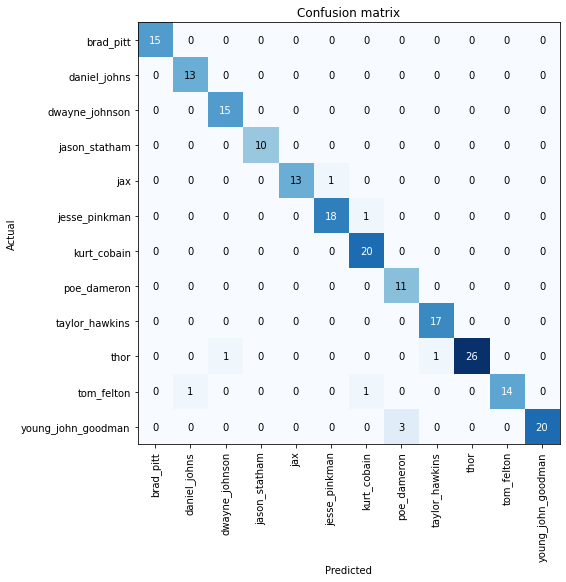

In [7]:
friends_interp.plot_confusion_matrix(figsize = (10,8))

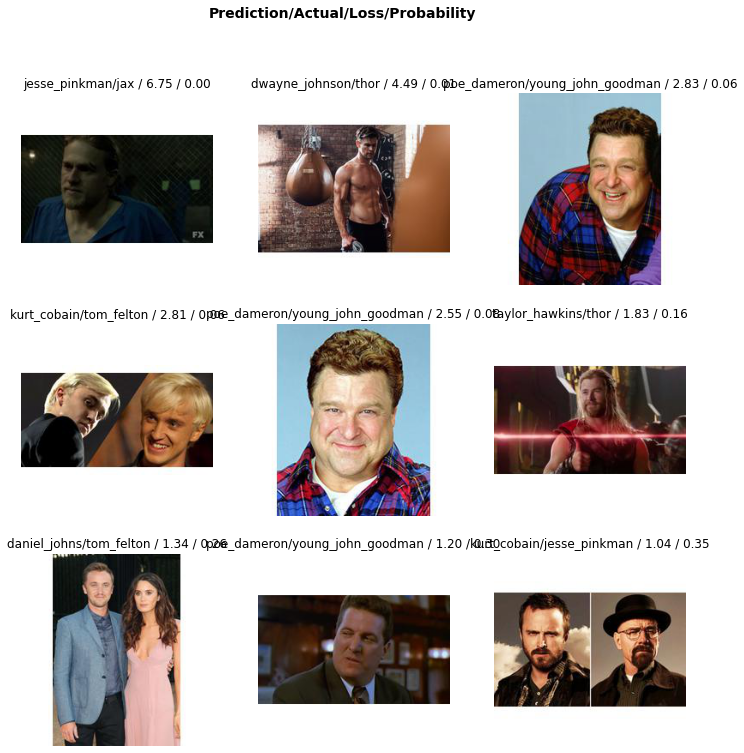

In [8]:
friends_interp.plot_top_losses(k = 9)

Ok! The model is having a satisfactory result in differentiating the celebrities, now let's check the results with my friends.

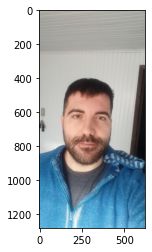

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Predicted celebrity: young_john_goodman -- Probability: 0.9914815425872803
Celebrities guesses:
brad_pitt: 0.0001373629638692364
daniel_johns: 0.00037232344038784504
dwayne_johnson: 0.0009805936133489013
jason_statham: 0.00039567076601088047
jax: 2.9742059268755838e-05
jesse_pinkman: 0.0014851938467472792
kurt_cobain: 8.56028989915103e-08
poe_dameron: 0.0017562676221132278
taylor_hawkins: 0.0005845218547619879
thor: 0.0014268879313021898
tom_felton: 0.0013497340260073543
young_john_goodman: 0.9914815425872803


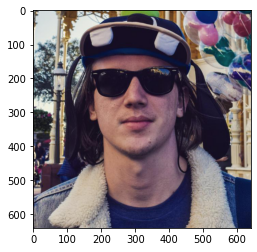

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Predicted celebrity: kurt_cobain -- Probability: 0.8185651898384094
Celebrities guesses:
brad_pitt: 0.02599227800965309
daniel_johns: 0.06106971576809883
dwayne_johnson: 8.473388879792765e-05
jason_statham: 0.0013953453162685037
jax: 0.006697293370962143
jesse_pinkman: 2.2678419554722495e-05
kurt_cobain: 0.8185651898384094
poe_dameron: 0.009182032197713852
taylor_hawkins: 0.0025846075732260942
thor: 5.876603609067388e-05
tom_felton: 0.07255740463733673
young_john_goodman: 0.0017898741643875837


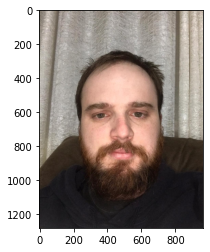

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Predicted celebrity: jesse_pinkman -- Probability: 0.6873689889907837
Celebrities guesses:
brad_pitt: 8.83589109434979e-06
daniel_johns: 7.112778985174373e-05
dwayne_johnson: 2.122672594850883e-05
jason_statham: 0.004130356013774872
jax: 3.49756664945744e-05
jesse_pinkman: 0.6873689889907837
kurt_cobain: 8.108739990575486e-08
poe_dameron: 4.519674621406011e-05
taylor_hawkins: 0.0007953463355079293
thor: 3.78267122869147e-06
tom_felton: 0.00046253399341367185
young_john_goodman: 0.3070574998855591


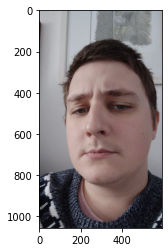

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Predicted celebrity: young_john_goodman -- Probability: 0.9260697364807129
Celebrities guesses:
brad_pitt: 4.136411007493734e-06
daniel_johns: 5.777278056484647e-05
dwayne_johnson: 1.3845210560248233e-05
jason_statham: 6.16872694081394e-06
jax: 0.0006652514566667378
jesse_pinkman: 0.06238485127687454
kurt_cobain: 5.164605681784451e-06
poe_dameron: 0.010277473367750645
taylor_hawkins: 4.3077903683297336e-05
thor: 1.0552300864219433e-06
tom_felton: 0.000471531500807032
young_john_goodman: 0.9260697364807129


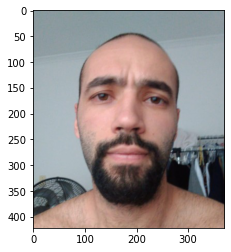

Predicted celebrity: young_john_goodman -- Probability: 0.3751683831214905
Celebrities guesses:
brad_pitt: 0.0006746943690814078
daniel_johns: 0.007651022169739008
dwayne_johnson: 0.3176578879356384
jason_statham: 0.09241193532943726
jax: 0.10697856545448303
jesse_pinkman: 0.019020043313503265
kurt_cobain: 2.4816583390929736e-05
poe_dameron: 0.04870416969060898
taylor_hawkins: 0.013845335692167282
thor: 0.009547748602926731
tom_felton: 0.008315522223711014
young_john_goodman: 0.3751683831214905


In [9]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for img_path in Path(base_dir + '/friends_photos/').ls():
  img = open_image(img_path)

  display_img = mpimg.imread(img_path)
  plt.imshow(display_img)
  plt.show()

  category = friends_learn.predict(img)[0]
  probability = friends_learn.predict(img)[2].max()


  print(f'Predicted celebrity: {category} -- Probability: {probability}')
  print(f'Celebrities guesses:')
  for i, c in enumerate(friends_data.classes):
    print(f'{c}: {friends_learn.predict(img)[2][i]}')

The results are seeming to be weird, let's run this model with my photos to see if the output will be similar with the one of the previous model.

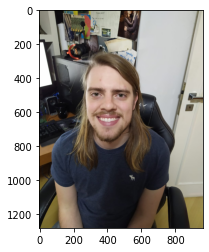

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Predicted celebrity: tom_felton -- Probability: 0.7469479441642761
Celebrities guesses:
brad_pitt: 0.0001313146494794637
daniel_johns: 0.03083684854209423
dwayne_johnson: 0.006377560552209616
jason_statham: 0.0019485903903841972
jax: 0.06622561067342758
jesse_pinkman: 0.019807029515504837
kurt_cobain: 0.0008490513428114355
poe_dameron: 0.0015637651085853577
taylor_hawkins: 0.03829345479607582
thor: 0.0031097494065761566
tom_felton: 0.7469479441642761
young_john_goodman: 0.08390916138887405


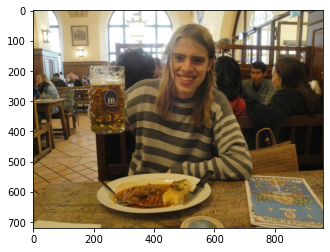

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Predicted celebrity: jesse_pinkman -- Probability: 0.8829143643379211
Celebrities guesses:
brad_pitt: 1.745618828863371e-05
daniel_johns: 0.0022955555468797684
dwayne_johnson: 3.619570270529948e-05
jason_statham: 6.092697617532394e-07
jax: 8.106041786959395e-05
jesse_pinkman: 0.8829143643379211
kurt_cobain: 1.0811900210683234e-05
poe_dameron: 2.8799608116969466e-05
taylor_hawkins: 0.000260461209109053
thor: 2.9077387719844694e-10
tom_felton: 0.023068692535161972
young_john_goodman: 0.09128599613904953


In [10]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for img_path in Path(base_dir + '/my_photos/').ls():
  img = open_image(img_path)

  display_img = mpimg.imread(img_path)
  plt.imshow(display_img)
  plt.show()

  category = friends_learn.predict(img)[0]
  probability = friends_learn.predict(img)[2].max()


  print(f'Predicted celebrity: {category} -- Probability: {probability}')
  print(f'Celebrities guesses:')
  for i, c in enumerate(friends_data.classes):
    print(f'{c}: {friends_learn.predict(img)[2][i]}')

Well, the results definitely didn't go as planned this time. The predictions from my photos don't make much sense just like my friends, that are predicted to look like John Goodman most of the times.

Those results make me reflect that the features the model uses to diferentiate the pictures aren't what I actually believe to be used (such as face and hair features).

Let's see from each class, which are the pictures that are scored with the greatest and the lowest value. Using those pictures, we'll apply a heatmap, developed on Fast.ai course, to be able to get a glimpse of what features the model uses most when classifying each celebrity.

brad_pitt
brad_pitt Highest Accuracy Picture - 99.8585433959961% Probability


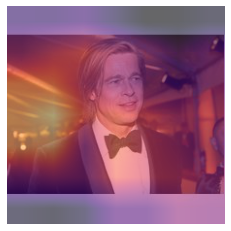

brad_pitt Lowest Accuracy Picture - 9.274431228637695% Probability


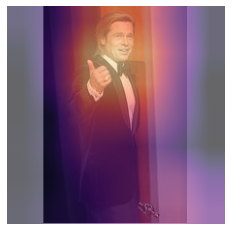

daniel_johns
daniel_johns Highest Accuracy Picture - 99.95628356933594% Probability


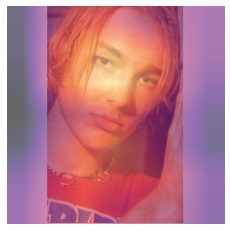

daniel_johns Lowest Accuracy Picture - 87.3848648071289% Probability


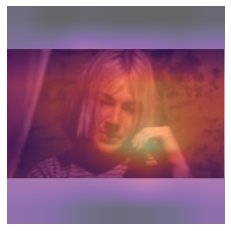

dwayne_johnson
dwayne_johnson Highest Accuracy Picture - 99.97307586669922% Probability


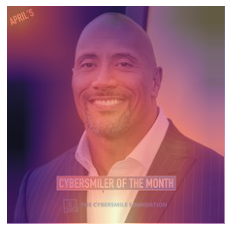

dwayne_johnson Lowest Accuracy Picture - 61.83123016357422% Probability


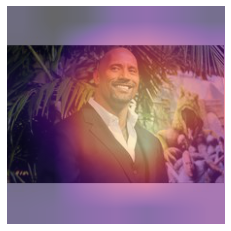

jason_statham
jason_statham Highest Accuracy Picture - 99.7143783569336% Probability


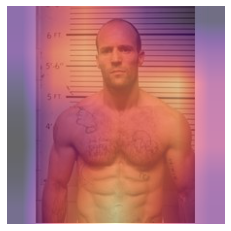

jason_statham Lowest Accuracy Picture - 0.0883311927318573% Probability


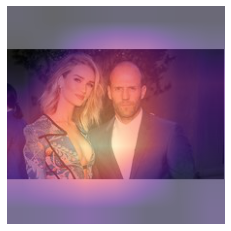

jax
jax Highest Accuracy Picture - 99.99717712402344% Probability


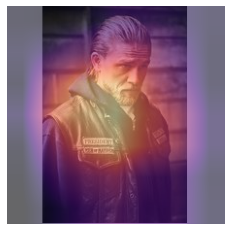

jax Lowest Accuracy Picture - 2.1780526638031006% Probability


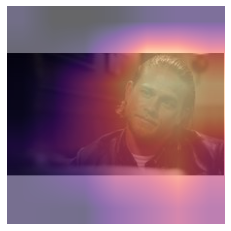

jesse_pinkman
jesse_pinkman Highest Accuracy Picture - 99.9855728149414% Probability


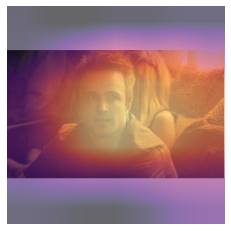

jesse_pinkman Lowest Accuracy Picture - 3.869206428527832% Probability


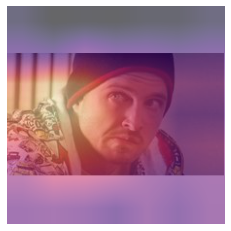

kurt_cobain
kurt_cobain Highest Accuracy Picture - 99.99752044677734% Probability


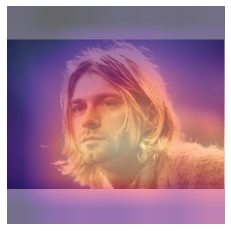

kurt_cobain Lowest Accuracy Picture - 83.81005859375% Probability


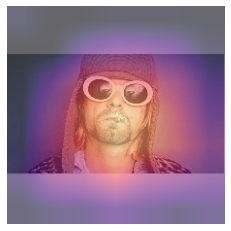

poe_dameron
poe_dameron Highest Accuracy Picture - 99.99457550048828% Probability


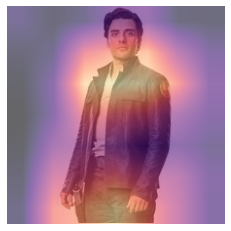

poe_dameron Lowest Accuracy Picture - 81.93122863769531% Probability


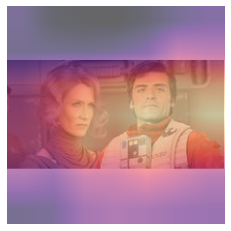

taylor_hawkins
taylor_hawkins Highest Accuracy Picture - 99.99984741210938% Probability


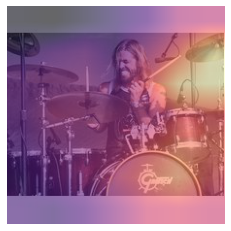

taylor_hawkins Lowest Accuracy Picture - 96.37235260009766% Probability


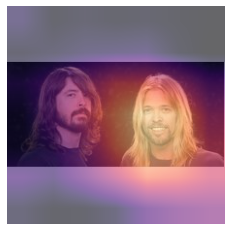

thor
thor Highest Accuracy Picture - 99.99623107910156% Probability


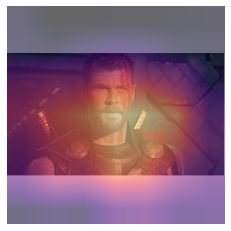

thor Lowest Accuracy Picture - 0.7257394790649414% Probability


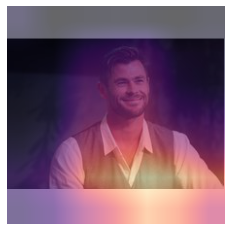

tom_felton
tom_felton Highest Accuracy Picture - 99.84375762939453% Probability


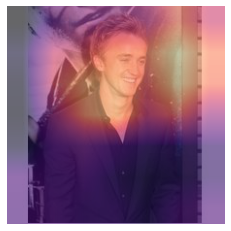

tom_felton Lowest Accuracy Picture - 2.0683434009552% Probability


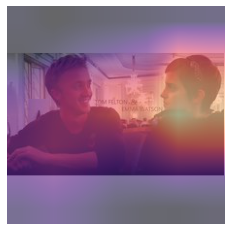

young_john_goodman
young_john_goodman Highest Accuracy Picture - 99.89701843261719% Probability


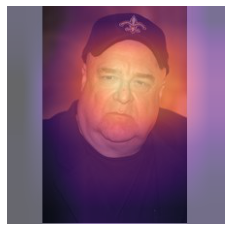

young_john_goodman Lowest Accuracy Picture - 0.21082592010498047% Probability


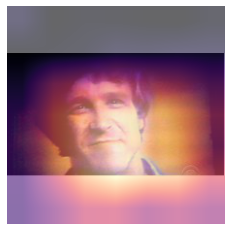

In [47]:
from fastai.callbacks.hooks import *

def show_heatmap(hm):

    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,224,224,0),
              interpolation='bilinear', cmap='magma');

m = friends_learn.model.eval();

for data_class in friends_data.classes:

  class_dict = {}

  for idx,img_data in enumerate(friends_data.dataset):  
    if str(img_data[1]) == data_class:
      class_dict[idx] = friends_learn.predict(img_data[0])[2][int(img_data[1])]

  print(data_class)

  keys = [max(class_dict, key=class_dict.get), min(class_dict, key=class_dict.get)]

  for idx_key, key in enumerate(keys):
    x,y = friends_data.dataset[key]
    xb,_ = friends_data.one_item(x)
    xb_im = Image(friends_data.denorm(xb)[0])
    xb = xb.cuda()

    def hooked_backward(cat=y):
        with hook_output(m[0]) as hook_a: 
            with hook_output(m[0], grad=True) as hook_g:
                preds = m(xb)
                preds[0,int(cat)].backward()
        return hook_a,hook_g

    hook_a,hook_g = hooked_backward()

    acts  = hook_a.stored[0].cpu()
    acts.shape

    avg_acts = acts.mean(0)
    avg_acts.shape

    if idx_key == 0:
      print(f'{data_class} Highest Accuracy Picture - {class_dict.get(key) * 100}% Probability')
      plt.show(show_heatmap(avg_acts))
    else:
      print(f'{data_class} Lowest Accuracy Picture - {class_dict.get(key) * 100}% Probability')
      plt.show(show_heatmap(avg_acts))

Well, it's become quite clear that, for most cases, the model is differentiating the pictures not because of the features I expected (face/hair) but using other aspects such as their clothing or the environment around them.
That probably also applies to my previous model, trained only to tell which celebrity I look more alike.

# Conclusions
To develop a model that uses primarily face/hair features, I believe I would need a much bigger and diversified dataset of pictures (with the celebrities wearing different clothes, in different places) or at least a dataset that uses only their faces/hair as input. That would probably deal with the problem of the wrong associations and/or focusing in the features that I believe that matter the most.

Still, doing this project was a great way for me to experiment and see what are important things to watch out for when developing a model that identify people, and also DL models in general. 

It's quite fun and interesting to observe that a DL model will use whichever resources it has available to get the best results, creating relations with features that are not necessarily true, but make sense. Differentiating people trough clothing and environment is a behaviour that it's very understandble and interpretable.

